In [2]:
import pygmt
import pandas as pd
import numpy as np
from obspy.clients.fdsn import Client
from obspy.core.utcdatetime import UTCDateTime
import datetime
import tempfile
from geopy.distance import geodesic
from shapely.geometry import Point
from shapely.ops import unary_union

In [3]:
year = 'nwa_shore'
# Load the catalogs 
matched_events_mycatalog2morton= pd.read_csv(f'../data/datasets_{year}/matched_events_with_morton_mycatalog.csv')
unmatched_events_mycatalog2morton_and_anss= pd.read_csv(f'../data/datasets_{year}/new_events.csv')
# new_events_filtered = pd.read_csv('../data/datasets_2014/new_events_filtered.csv')
unmatched_events_morton2mycatalog= pd.read_csv(f'../data/datasets_{year}/missing_events_from_mycatalog_morton.csv')
matched_events_morton2mycatalog= pd.read_csv(f'../data/datasets_{year}/matched_events_with_mycatalog_morton.csv')
unmatched_events_anss2mycatalog = pd.read_csv(f'../data/datasets_{year}/missing_events_from_mycatalog_anss.csv')
matched_events_mycatalog2anss= pd.read_csv(f'../data/datasets_{year}/matched_events_with_anss_mycatalog.csv')
matched_events_anss2mycatalog= pd.read_csv(f'../data/datasets_{year}/matched_events_with_mycatalog_anss.csv')

anss_events = pd.read_csv('../data/datasets_anss/anss_2011-15.csv')


## Load Station Information

In [4]:
year='nwa_shore'
all_picks = pd.read_csv(f'../data/datasets_{year}/all_picks_all_years_for_assoc_{year}.csv')
# all_picks_for_picking = pd.read_csv(f'../data/datasets_{year}/all_picks_{year}_for_picking.csv')
all_pick_assignments = pd.read_csv(f'../data/datasets_{year}/all_pick_assignments_{year}.csv')
all_pick_assignments

,Unnamed: 0,idx,time,x,y,z,picks,latitude,longitude,depth,event_idx,pick_idx,residual,station,phase,time_pick
0,0,1,2011-03-01 17:07:07.540138+00:00,59.686846,375.950591,31.640625,6,47.879445,-124.702035,31.640625,1,397897,0.302324,FORK,P,1.298999e+09
1,1,1,2011-03-01 17:07:07.540138+00:00,59.686846,375.950591,31.640625,6,47.879445,-124.702035,31.640625,1,681872,0.095024,FORK,S,1.298999e+09
2,2,1,2011-03-01 17:07:07.540138+00:00,59.686846,375.950591,31.640625,6,47.879445,-124.702035,31.640625,1,378019,-0.104036,OFR,P,1.298999e+09
3,3,1,2011-03-01 17:07:07.540138+00:00,59.686846,375.950591,31.640625,6,47.879445,-124.702035,31.640625,1,665801,-0.195118,OFR,S,1.298999e+09
4,4,1,2011-03-01 17:07:07.540138+00:00,59.686846,375.950591,31.640625,6,47.879445,-124.702035,31.640625,1,357083,0.293664,OZB,P,1.298999e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1789,1789,425,2015-12-30 07:39:28.170022+00:00,175.713613,467.496316,15.234375,6,48.680781,-123.113740,15.234375,425,626156,0.193057,BFSB,S,1.451461e+09
1790,1790,425,2015-12-30 07:39:28.170022+00:00,175.713613,467.496316,15.234375,6,48.680781,-123.113740,15.234375,425,340935,0.234987,FORK,P,1.451461e+09
1791,1791,425,2015-12-30 07:39:28.170022+00:00,175.713613,467.496316,15.234375,6,48.680781,-123.113740,15.234375,425,637234,-0.141743,FORK,S,1.451461e+09
1792,1792,425,2015-12-30 07:39:28.170022+00:00,175.713613,467.496316,15.234375,6,48.680781,-123.113740,15.234375,425,299072,-0.184442,TOFB,P,1.451461e+09


### Station info for stations used after association 

In [5]:
available_networks = ','.join(all_picks['station_network_code'].drop_duplicates().values)
available_networks

'7D,UW,CN,C8'

In [6]:
stations = all_pick_assignments['station'].drop_duplicates().values
len(stations)

13

In [7]:
# Obtain the latitudes of longitude of the stations used
client = Client("IRIS")

sta_lat = []
sta_lon = []
sta_names = []

for station in stations:

    # Fetch the station inventory
    inventory = client.get_stations(network=available_networks, station=station, level='station')

    # The correct path to access the station's latitude and longitude
    _sta_lat = inventory[0][0].latitude
    _sta_lon = inventory[0][0].longitude
    
    sta_lat.append(_sta_lat)
    sta_lon.append(_sta_lon)
    sta_names.append(inventory.networks[0].code+'.'+station)

In [8]:
# Append the number of picks for each station to a list
# Create a list of stations 
ls_sta = stations
# Create a list that contain the number of picks for each station
num_picks = []
for i in ls_sta:
    _num_picks = len(all_picks[all_picks['station_code']==i])
    num_picks.append(_num_picks)

In [9]:
del all_picks

### Station info for original stations for picking

In [ ]:
available_stations = np.array(all_picks_for_picking[['station_network_code','station_code']].drop_duplicates(subset='station_code'))
len(available_stations)

In [ ]:
# arr_available_stations = np.array(available_stations)
# arr_available_stations

In [ ]:
# np.unique(arr_available_stations[:,0])

In [ ]:
# # Obtain the latitudes of longitude of the stations used
# client = Client("IRIS")

# sta_7D_lat = []
# sta_7D_lon = []
# other_sta_lat = []
# other_sta_lon = []
# for network, station in available_stations:

#     # Fetch the station inventory
#     inventory = client.get_stations(network=network, station=station, level='station')

#     # The correct path to access the station's latitude and longitude
#     sta_lat = inventory[0][0].latitude
#     sta_lon = inventory[0][0].longitude

#     # Check if the station belongs to network '7D'
#     if network == '7D':
#         sta_7D_lat.append(sta_lat)
#         sta_7D_lon.append(sta_lon)
#     else:
#         other_sta_lat.append(sta_lat)
#         other_sta_lon.append(sta_lon)



In [ ]:
# Obtain the latitudes of longitude of the stations used
client = Client("IRIS")

sta_lat1 = []
sta_lon1 = []
sta_names1 = []

for network, station in available_stations:

    # Fetch the station inventory
    inventory = client.get_stations(network=network, station=station, level='station')

    # The correct path to access the station's latitude and longitude
    _sta_lat1 = inventory[0][0].latitude
    _sta_lon1 = inventory[0][0].longitude
    
    sta_lat1.append(_sta_lat1)
    sta_lon1.append(_sta_lon1)
    sta_names1.append(network+'.'+station)

In [ ]:
len(sta_names1)

In [ ]:
# Append the number of picks for each station to a list
# Create a list of stations 
ls_sta1 = all_picks_for_picking.drop_duplicates(subset='station_code')['station_code'].values
# Create a list that contain the number of picks for each station
num_picks1 = []
for i in ls_sta1:
    _num_picks1 = len(all_picks_for_picking[all_picks_for_picking['station_code']==i])
    num_picks1.append(_num_picks1)

In [ ]:
del all_picks_for_picking,all_pick_assignments

In [ ]:
# Obtain the latitudes and longitudes of the ANSS events
anss_events_lat = anss_events['latitude']
anss_events_lon = anss_events['longitude']

## Station Map
Plot only the stations that have picks for the newly found events

### Station map for stations used after association 

In [ ]:
# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[-127, -123, 40, 50])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [-127, -123, 40, 50]
title = "Matched and Newly Found Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo", shading=shade, transparency=50)
pygmt.makecpt(cmap="viridis", series=[min(num_picks), max(num_picks)])

# Plot stations
fig.plot(x=sta_lon, y=sta_lat, fill=num_picks, style="t0.4c", pen="black", cmap=True, label="Stations")
fig.colorbar(frame="xaf+lNumber of Picks per Station")

# Plot station names with arrows
for lon, lat, name in zip(sta_lon, sta_lat, sta_names):
    # Adjust the offset for the text position
    text_lon = lon + 0.05
    text_lat = lat + 0.05
    
    # Draw an arrow from the station to the text position
    fig.plot(x=[lon, text_lon], y=[lat, text_lat], pen="1p,black", style="v0.2c+e")
    
    # Place the station name at the adjusted position
    fig.text(x=text_lon, y=text_lat, text=name, font="6p,Helvetica-Bold,black", justify="ML")

# Add a legend to the plot
# fig.legend(position="JTR+w9+jTR", box='+gwhite+p1p')

# Save and display the figure
fig.savefig(f"station_map_{year}_for_assoc.pdf")
fig.show()


### Station map for stations used for phase picking

In [ ]:
# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[-127, -123, 40, 50])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [-127, -123, 40, 50]
title = "Matched and Newly Found Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo", shading=shade, transparency=50)
pygmt.makecpt(cmap="viridis", series=[min(num_picks1), max(num_picks1)])

# Plot stations
fig.plot(x=sta_lon1, y=sta_lat1, fill=num_picks1, style="t0.4c", pen="black", cmap=True, label="Stations")
fig.colorbar(frame="xaf+lNumber of Picks per Station")

# Plot station names with arrows
for lon, lat, name in zip(sta_lon1, sta_lat1, sta_names1):
    # Adjust the offset for the text position
    text_lon = lon + 0.05
    text_lat = lat + 0.05
    
    # Draw an arrow from the station to the text position
    fig.plot(x=[lon, text_lon], y=[lat, text_lat], pen="1p,black", style="v0.2c+e")
    
    # Place the station name at the adjusted position
    fig.text(x=text_lon, y=text_lat, text=name, font="6p,Helvetica-Bold,black", justify="ML")

# Add a legend to the plot
# fig.legend(position="JTR+w9+jTR", box='+gwhite+p1p')

# Save and display the figure
fig.savefig(f"station_map_{year}_for_picking.pdf")
fig.show()


## Load the nodes information for assocation by region

In [11]:
nodes = pd.read_csv(f'../data/datasets_{year}/nodes_{year}.csv')
nodes

,Unnamed: 0,node,latitude_deg,latitude_min,longitude_deg,longitude_min,radius,buffer_zone,velocity_model_id,latitude,longitude
0,0,nod,47,24.0,124,35.0,15,15,9,47.400000,-124.583333
1,1,nod,47,33.0,124,35.0,15,15,9,47.550000,-124.583333
2,2,nod,47,42.0,124,40.0,15,15,9,47.700000,-124.666667
3,3,nod,47,51.0,124,40.0,15,15,9,47.850000,-124.666667
4,4,nod,48,0.0,124,50.0,15,15,9,48.000000,-124.833333
5,5,nod,48,9.0,124,50.0,15,15,9,48.150000,-124.833333
6,6,nod,48,18.0,125,0.0,15,15,9,48.300000,-125.000000
7,7,nod,48,27.0,125,0.0,15,15,9,48.450000,-125.000000
8,8,nod,48,36.0,125,5.0,15,15,9,48.600000,-125.083333
9,9,nod,48,41.0,125,20.0,15,15,9,48.683333,-125.333333


In [12]:
union_circles.exterior

NameError: name 'union_circles' is not defined

## Final map on the poster

/tmp/ipykernel_2409635/3438275165.py:71: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=matched_events_anss2mycatalog['longitude'], y=matched_events_anss2mycatalog['latitude'],
/tmp/ipykernel_2409635/3438275165.py:74: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=matched_events_morton2mycatalog['LON'], y=matched_events_morton2mycatalog['LAT'],
/tmp/ipykernel_2409635/3438275165.py:76: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=unmatched_events_morton2mycatalog['LON'], y=unmatched_events_morton2mycatalog["LAT"],
/tmp/ipykernel_2409635/3438275165.py:78: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=matched_eve

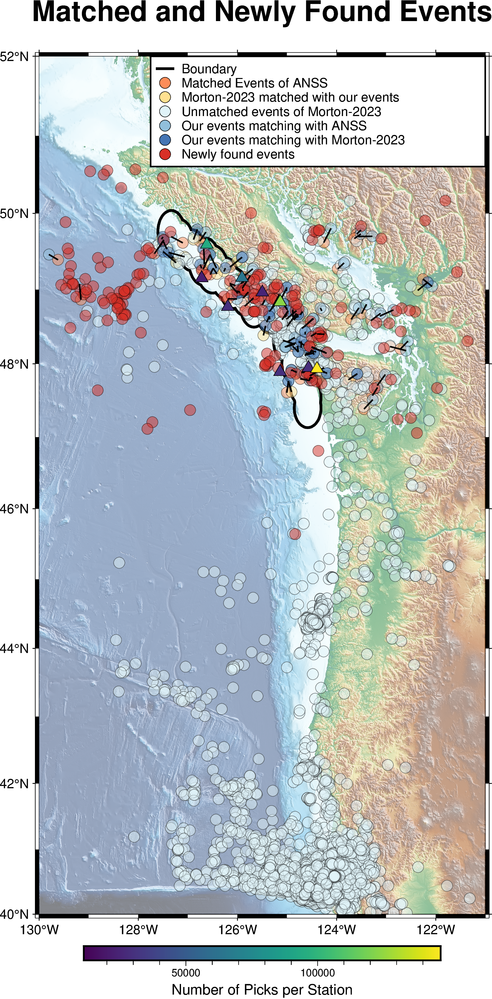

In [15]:
fig = pygmt.Figure()

# Define target region
min_lat= 40
max_lat=52

min_lon=-130
max_lon=-121

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

region = [min_lon, max_lon, min_lat, max_lat]
title = "Matched and Newly Found Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo",shading=shade, transparency=50)
pygmt.makecpt(cmap="viridis", series=[min(num_picks), max(num_picks)])

# Adjust plot calls to use 'style' correctly
# PLot the stations
# fig.plot(x=sta_lon, y=sta_lat,  
#          fill='black', style="t0.4c", pen="black", label="Stations")
# fig.plot(x=other_sta_lon, y=other_sta_lat,  
#          fill='white', style="t0.4c", pen="black", label="Other Stations")

# # Draw circles at the nodes
# for idx, row in nodes.iterrows():
#     fig.plot(
#         x=row["longitude"],
#         y=row["latitude"],
#         style="c0.1c",  # Circle with 0.5 cm radius
#         color="red",
#         pen="0.5p,black"
#     )
#     fig.plot(
#         x=row["longitude"],
#         y=row["latitude"],
#         style=f"c{row['radius']/((max_lon-min_lon)*2.8)}c",# Circle with radius in km
#         pen="0.5p,black"
#     )
#     fig.plot(
#             x=row["longitude"],
#             y=row["latitude"],
#             style=f"c{(row['radius'] + row['buffer_zone']) / ((max_lon - min_lon) * 2.8)}c",  # Circle with radius in km
#             pen=f"0.5p,black"
#         )

#  Draw only the boundary
# to maintain the circular shape of the union
circles = []

# Create circles and compute their union
for _, row in nodes.iterrows():
    center = Point(row['longitude'], row['latitude'])  # (longitude, latitude)
    radius_deg = (row['radius'] + row['buffer_zone']) / 111  # Approximate conversion
    circles.append(center.buffer(radius_deg))  # Create circle and add to list

# Compute union and plot outline
union_circles = unary_union(circles)

if union_circles.geom_type == 'Polygon':
    fig.plot(x=union_circles.exterior.xy[0], y=union_circles.exterior.xy[1], pen="2p,black", label="Boundary")
elif union_circles.geom_type == 'MultiPolygon':
    for polygon in union_circles.geoms:
        fig.plot(x=polygon.exterior.xy[0], y=polygon.exterior.xy[1], pen="2p,black", label="Boundary")

# Plotting data points


fig.plot(x=matched_events_anss2mycatalog['longitude'], y=matched_events_anss2mycatalog['latitude'],  
         style="c0.3c", color='#fc8d59', pen="black",  transparency=50,label='Matched Events of ANSS')

fig.plot(x=matched_events_morton2mycatalog['LON'], y=matched_events_morton2mycatalog['LAT'],  
         style="c0.3c", color='#fee090', pen="black",  transparency=50,label='Morton-2023 matched with our events')
fig.plot(x=unmatched_events_morton2mycatalog['LON'], y=unmatched_events_morton2mycatalog["LAT"],  
         style="c0.3c", color='#e0f3f8', pen="black",  transparency=50,label='Unmatched events of Morton-2023')
fig.plot(x=matched_events_mycatalog2anss['longitude'], y=matched_events_mycatalog2anss["latitude"],  
         style="c0.3c", color='#91bfdb', pen="black",  transparency=50,label='Our events matching with ANSS')
fig.plot(x=matched_events_mycatalog2morton['longitude'], y=matched_events_mycatalog2morton['latitude'],  
         style="c0.3c", color='#4575b4', pen="black",  transparency=50,label='Our events matching with Morton-2023')
fig.plot(x=unmatched_events_mycatalog2morton_and_anss['longitude'], y=unmatched_events_mycatalog2morton_and_anss['latitude'],  
         style="c0.3c", color='#d73027', pen="black", transparency=50, label='Newly found events')
# # Plot lines between matched events
for i in range(len(matched_events_mycatalog2morton)):
    fig.plot(
        x=[matched_events_morton2mycatalog.iloc[i]['LON'], matched_events_mycatalog2morton.iloc[i]['longitude']],
        y=[matched_events_morton2mycatalog.iloc[i]['LAT'], matched_events_mycatalog2morton.iloc[i]['latitude']],
        pen="1p,black"
    )
    
for i in range(len(matched_events_mycatalog2anss)):
    fig.plot(
        x=[matched_events_anss2mycatalog.iloc[i]['longitude'], matched_events_mycatalog2anss.iloc[i]['longitude']],
        y=[matched_events_anss2mycatalog.iloc[i]['latitude'], matched_events_mycatalog2anss.iloc[i]['latitude']],
        pen="1p,black"
    )

# fig.plot(x=sta_lon, y=sta_lat,  
#          fill='gray', style="t0.4c", pen="black", label="Stations")

# Plot stations
fig.plot(x=sta_lon, y=sta_lat, fill=num_picks, style="t0.4c", pen="black", cmap=True, label="Stations")
fig.colorbar(frame="xaf+lNumber of Picks per Station")

# Add a legend to the plot
fig.legend(position="JTR+w9+jTR", box='+gwhite+p1p')
fig.savefig(f"matched_and_newly_found_Events_{year}.pdf")
# Display the figure
fig.show()



In [46]:
circle_coords_geo

[30.127855425914888,
 30.000285859001778,
 29.622059376206614,
 29.006605112326618,
 28.176255370762856,
 27.162196683600214,
 26.004430886309372,
 24.751718853403368,
 23.461371972673565,
 22.198549572600495,
 21.034405181179427,
 20.042109738381768,
 19.289842516441503,
 18.8309111225554,
 18.693446631115375,
 18.8741824813528,
 19.339993974734274,
 20.0367228391891,
 20.90094174724657,
 21.87005397004696,
 22.88858563960529,
 23.91089107246463,
 24.901461327740932,
 25.83397148472644,
 26.689817641388704,
 27.456552606541713,
 28.12641592468694,
 28.69504198651243,
 29.16037607494366,
 29.52180201872397,
 29.779471072190738,
 29.93381362188137,
 29.98521194641305,
 29.933813621881377,
 29.779471072190738,
 29.521802018723978,
 29.16037607494367,
 28.695041986512436,
 28.126415924686928,
 27.456552606541713,
 26.689817641388718,
 25.833971484726447,
 24.901461327740932,
 23.910891072464626,
 22.888585639605314,
 21.870053970046957,
 20.90094174724657,
 20.0367228391891,
 19.339993974

In [43]:
circles = []
# Loop through the DataFrame rows to create circles
for _, row in nodes.iterrows():
    center = Point(row['latitude'], row['longitude'])  # (longitude, latitude)
    
    # Radius in degrees (depending on the map projection, this might need tweaking for accuracy)
    radius = (row['radius'] + row['buffer_zone'])  # Approximate conversion: 1 degree ~ 111 km
    
#     # Add buffer as a circle in geographic coordinates
#     circles.append(center.buffer(radius))  # Create circle and add to the list
        
    circle_coords = center.buffer(radius).exterior.coords
    center_coords =(row['latitude'], row['longitude'])
    circle_coords_geo = []
    for j in range(len(circle_coords)):
        circle_coords_geo.append((geodesic(center_coords, circle_coords[j]).km)/111)
    circles.append(Poly)

# Compute the union of all circles
union_circles = unary_union(circle_coords_geo)

TypeError: One of the arguments is of incorrect type. Please provide only Geometry objects.

In [45]:
circles

[<POLYGON ((-94.583 47.4, -94.728 44.459, -95.16 41.547, -95.875 38.691, -96....>,
 <POLYGON ((-94.583 47.55, -94.728 44.609, -95.16 41.697, -95.875 38.841, -96...>,
 <POLYGON ((-94.667 47.7, -94.811 44.759, -95.243 41.847, -95.958 38.991, -96...>,
 <POLYGON ((-94.667 47.85, -94.811 44.909, -95.243 41.997, -95.958 39.141, -9...>,
 <POLYGON ((-94.833 48, -94.978 45.059, -95.41 42.147, -96.125 39.291, -97.11...>,
 <POLYGON ((-94.833 48.15, -94.978 45.209, -95.41 42.297, -96.125 39.441, -97...>,
 <POLYGON ((-95 48.3, -95.144 45.359, -95.576 42.447, -96.292 39.591, -97.284...>,
 <POLYGON ((-95 48.45, -95.144 45.509, -95.576 42.597, -96.292 39.741, -97.28...>,
 <POLYGON ((-95.083 48.6, -95.228 45.659, -95.66 42.747, -96.375 39.891, -97....>,
 <POLYGON ((-95.333 48.683, -95.478 45.743, -95.91 42.831, -96.625 39.975, -9...>,
 <POLYGON ((-95.667 48.767, -95.811 45.826, -96.243 42.914, -96.958 40.058, -...>,
 <POLYGON ((-95.833 48.917, -95.978 45.976, -96.41 43.064, -97.125 40.208, -9...>,
 <PO

In [40]:
center = Point(row['latitude'], row['longitude'])  # (longitude, latitude)
# Radius in degrees (depending on the map projection, this might need tweaking for accuracy)
radius = (row['radius'] + row['buffer_zone'])  # Approximate conversion: 1 degree ~ 111 km
circle_coords = center.buffer(radius).exterior.coords
center_coords =(row['latitude'], row['longitude'])
circle_coords_geo = []
for j in range(len(circle_coords)):
    circle_coords_geo.append((geodesic(center_coords, circle_coords[j]).km)/111)
    
    


In [22]:
np.array(union_circles.exterior.xy[0])

array([ -94.16421636,  -95.63275575,  -97.39856357,  -99.44463413,
       -101.75126266, -104.29623505, -107.05504184, -110.00111421,
       -113.10607987, -116.3400363 , -119.67183873, -123.06940009,
       -126.5       , -129.93059991, -133.32816127, -136.6599637 ,
       -139.89392013, -142.99888579, -145.94495816, -145.94568805,
       -146.11162482, -148.87043161, -151.41540401, -153.72203253,
       -155.7681031 , -157.53391092, -159.0024503 , -160.15957842,
       -160.99415148, -161.4981321 , -161.66666667, -161.4981321 ,
       -160.99415148, -160.15957842, -159.0024503 , -157.53391092,
       -155.7681031 , -153.72203253, -151.41540401, -148.87043161,
       -146.11162482, -143.16555246, -140.0605868 , -136.82663037,
       -133.49482794, -130.09726658, -126.66666667, -123.23606676,
       -119.8385054 , -116.50670296, -113.27274653, -110.16778088,
       -107.22170851, -107.22097862, -107.05504184, -104.29623505,
       -101.75126266,  -99.44463413,  -97.39856357,  -95.63275

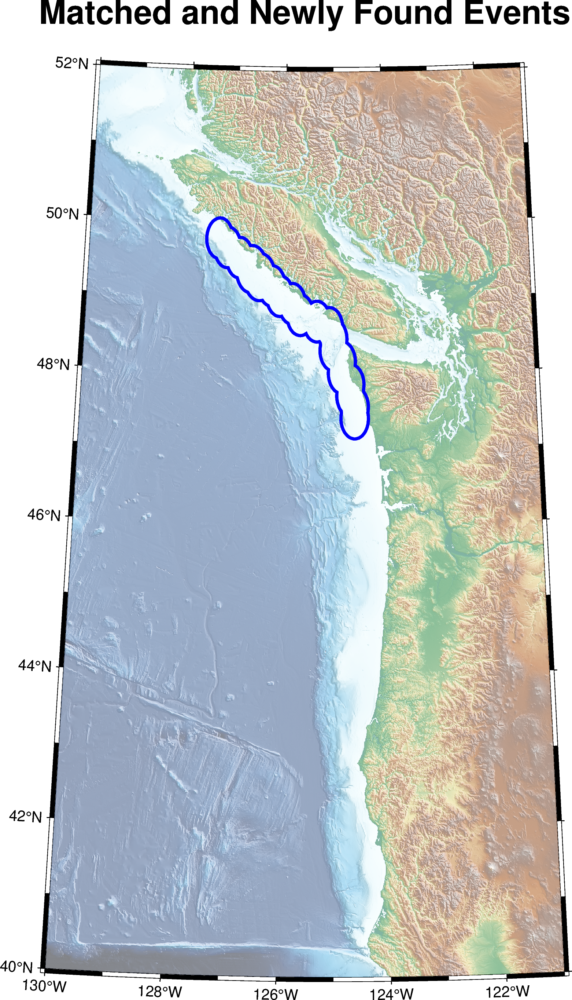

In [11]:
fig = pygmt.Figure()

# Define the region (keep this as is)
min_lat = 40
max_lat = 52
min_lon = -130
max_lon = -121

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Use Albers Conic Equal-Area Projection to avoid circle distortion
region = [min_lon, max_lon, min_lat, max_lat]
title = "Matched and Newly Found Events"
fig.basemap(region=region, projection="B-125/45/40/50/12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo", shading=shade, transparency=50)

# Rest of the code remains the same, but now using an equal-area projection
# to maintain the circular shape of the union
circles = []

# Create circles and compute their union
for _, row in nodes.iterrows():
    center = Point(row['longitude'], row['latitude'])  # (longitude, latitude)
    radius_deg = (row['radius'] + row['buffer_zone']) / 111  # Approximate conversion
    circles.append(center.buffer(radius_deg))  # Create circle and add to list

# Compute union and plot outline
union_circles = unary_union(circles)

if union_circles.geom_type == 'Polygon':
    fig.plot(x=union_circles.exterior.xy[0], y=union_circles.exterior.xy[1], pen="2p,blue")
elif union_circles.geom_type == 'MultiPolygon':
    for polygon in union_circles.geoms:
        fig.plot(x=polygon.exterior.xy[0], y=polygon.exterior.xy[1], pen="2p,blue")

# Plot additional data points (this part is unchanged)

# Display the figure
fig.show()


In [ ]:
from pyproj import Geod
from shapely.geometry import Point
from shapely.ops import unary_union

# Initialize Geodetic object (WGS84 ellipsoid)
geod = Geod(ellps="WGS84")

# Create circles in meters rather than degrees
circles = []
for _, row in nodes.iterrows():
    center = Point(row['longitude'], row['latitude'])  # Center point in lon/lat
    
    # Buffer the point using a geodetic buffer (radius in meters)
    radius_meters = row['radius'] * 1000  # Assuming radius is in km
    circle = center.buffer(radius_meters, resolution=16)  # Create circle with finer resolution
    circles.append(circle)

# Compute the union of all circles
union_circles = unary_union(circles)

# Plot the union outline
if union_circles.geom_type == 'Polygon':
    fig.plot(x=union_circles.exterior.xy[0], y=union_circles.exterior.xy[1], pen="2p,blue")
elif union_circles.geom_type == 'MultiPolygon':
    for polygon in union_circles.geoms:
        fig.plot(x=polygon.exterior.xy[0], y=polygon.exterior.xy[1], pen="2p,blue")

# Continue with the rest of the code for map plotting


### Plot the same map above with a representation of picks by size

In [ ]:
# Define the number of picks
picks_new_events = unmatched_events_mycatalog2morton_and_anss['picks']
picks_mycatalog2anss = matched_events_mycatalog2anss['picks']
picks_mycatalog2morton = matched_events_mycatalog2morton['picks']

#Parameters
# Define target region
min_lat= 40
max_lat=52

min_lon=-130
max_lon=-121

# Plotting parameters
transparency = 60

# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [min_lon, max_lon, min_lat, max_lat]
title = "Matched and Newly Found Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo", shading=shade, transparency=50)
pygmt.makecpt(cmap="viridis", series=[min(num_picks), max(num_picks)])

# Draw circles at the nodes
for idx, row in nodes.iterrows():
    fig.plot(
        x=row["longitude"],
        y=row["latitude"],
        style="c0.1c",  # Circle with 0.5 cm radius
        color="red",
        pen="1p,black"
    )
    fig.plot(
        x=row["longitude"],
        y=row["latitude"],
        style=f"c{row['radius']/((max_lon-min_lon)*2.8)}c",# Circle with radius in km
        pen="1p,black"
    )
    fig.plot(
            x=row["longitude"],
            y=row["latitude"],
            style=f"c{(row['radius'] + row['buffer_zone']) / ((max_lon - min_lon) * 2.8)}c",  # Circle with radius in km
            pen=f"1p,black"
        )

# Plotting data points with dynamic transparency and sizes

fig.plot(
    x=matched_events_mycatalog2anss['longitude'],
    y=matched_events_mycatalog2anss["latitude"],
    size=0.03 * (matched_events_mycatalog2anss['picks']+5),
    style="c", color='#91bfdb', pen="black",transparency=transparency,
    label='Our events matching with ANSS'
)
fig.plot(
    x=matched_events_mycatalog2morton['longitude'],
    y=matched_events_mycatalog2morton['latitude'],
    size=0.03 * (matched_events_mycatalog2morton['picks']+5),
    style="c", color='#4575b4', pen="black",transparency=transparency,
    label='Our events matching with Morton-2023'
)
fig.plot(
    x=matched_events_anss2mycatalog['longitude'],
    y=matched_events_anss2mycatalog['latitude'],
    style="c0.3c", color='#fc8d59', pen="black",transparency=transparency,
    label='ANSS matched with our events'
)
fig.plot(
    x=matched_events_morton2mycatalog['LON'],
    y=matched_events_morton2mycatalog['LAT'],
    style="c0.3c", color='#fee090', pen="black",transparency=transparency,
    label='Morton-2023 matched with our events'
)
fig.plot(
    x=unmatched_events_morton2mycatalog['LON'],
    y=unmatched_events_morton2mycatalog["LAT"],
    style="c0.3c", color='#e0f3f8', pen="black",transparency=transparency,
    label='Unmatched events of Morton-2023'
)


# Plot lines between matched events
for i in range(len(matched_events_mycatalog2morton)):
    fig.plot(
        x=[matched_events_morton2mycatalog.iloc[i]['LON'], matched_events_mycatalog2morton.iloc[i]['longitude']],
        y=[matched_events_morton2mycatalog.iloc[i]['LAT'], matched_events_mycatalog2morton.iloc[i]['latitude']],
        pen="1p,black"
    )
    
for i in range(len(matched_events_mycatalog2anss)):
    fig.plot(
        x=[matched_events_anss2mycatalog.iloc[i]['longitude'], matched_events_mycatalog2anss.iloc[i]['longitude']],
        y=[matched_events_anss2mycatalog.iloc[i]['latitude'], matched_events_mycatalog2anss.iloc[i]['latitude']],
        pen="1p,black"
    )
fig.plot(
    x=unmatched_events_mycatalog2morton_and_anss['longitude'],
    y=unmatched_events_mycatalog2morton_and_anss['latitude'],
    size=0.03 * (unmatched_events_mycatalog2morton_and_anss['picks']+5),
    style="c", color='#d73027', pen="black", transparency=transparency,
    label='Newly found events'
)

# fig.plot(x=sta_lon, y=sta_lat, fill='white', style="t0.4c", pen="black", label="Stations")

# Plot stations
fig.plot(x=sta_lon, y=sta_lat, fill=num_picks, style="t0.4c", pen="black", cmap=True, label="Stations")
fig.colorbar(frame="xaf+lNumber of Picks per Station")

legend_entries = """
S 0.3c c 0.3c #d73027 0.25p 0.3i Newly found events
S 0.3c c 0.3c #fc8d59 0.25p 0.3i ANSS matched with our events
S 0.3c c 0.3c #fee090 0.25p 0.3i Morton-2023 matched with our events
S 0.3c c 0.3c #e0f3f8 0.25p 0.3i Unmatched events of Morton-2023
S 0.3c c 0.3c #91bfdb 0.25p 0.3i Our events matching with ANSS 
S 0.3c c 0.3c #4575b4 0.25p 0.3i Our events matching with Morton-2023
S 0.3c t 0.3c white 0.25p 0.3i Station
"""

# Write legend entries to a temporary file
with tempfile.NamedTemporaryFile(mode='w+', delete=False) as tmpfile:
    tmpfile.write(legend_entries)
    tmpfile_path = tmpfile.name
    
# Add a legend for the pick scale to the plot
fig.legend(spec=tmpfile_path,position="JTR+w8+jTR", box='+gwhite+p1p')

sizes = (np.linspace(unmatched_events_mycatalog2morton_and_anss['picks'].min(), unmatched_events_mycatalog2morton_and_anss['picks'].max(), 22)+5) * 0.03

legend_entries = f"""
S 0.3c c {sizes[0]:.2f}c white 0.25p 0.3i {round(sizes[0]/0.03)} Picks
S 0.3c c {sizes[1]:.2f}c white 0.25p 0.3i {round(sizes[1]/0.03)} Picks
S 0.3c c {sizes[2]:.2f}c white 0.25p 0.3i {round(sizes[2]/0.03)} Picks
S 0.3c c {sizes[3]:.2f}c white 0.25p 0.3i {round(sizes[3]/0.03)} Picks
"""

# Write legend entries to a temporary file
with tempfile.NamedTemporaryFile(mode='w+', delete=False) as tmpfile:
    tmpfile.write(legend_entries)
    tmpfile_path = tmpfile.name

# Add the second legend to the plot below the first legend
fig.legend(spec=tmpfile_path, position="JTR+w3+jTR+o0c/3.2c", box='+gwhite+p1p')


# Save and display the figure
fig.savefig(f"matched_and_newly_found_Events_by_picks_{year}.pdf")
fig.show()


### Plot the same map above with a representation of picks by transparency

In [ ]:
fig = pygmt.Figure()

# Define the number of picks
picks_new_events = unmatched_events_mycatalog2morton_and_anss['picks']
picks_mycatalog2anss = matched_events_mycatalog2anss['picks']
picks_mycatalog2morton = matched_events_mycatalog2morton['picks']

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[-127, -123, 40, 50])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")
# Define target region
region = [-127, -123, 40, 50]
title = "Matched and Newly Found Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo",shading=shade, transparency=50)

# Adjust plot calls to use 'style' correctly
# Plot the stations
# fig.plot(x=sta_lon, y=sta_lat,  
#          fill='black', style="t0.4c", pen="black", label="Stations")
# fig.plot(x=other_sta_lon, y=other_sta_lat,  
#          fill='white', style="t0.4c", pen="black", label="Other Stations")

# Plotting data points

fig.plot(x=unmatched_events_mycatalog2morton_and_anss['longitude'], y=unmatched_events_mycatalog2morton_and_anss['latitude'],  
         style="c0.3c", color='#e41a1c', pen="black", label='Newly found events',transparency=picks_new_events)
fig.plot(x=matched_events_anss2mycatalog['longitude'], y=matched_events_anss2mycatalog['latitude'],  
         style="c0.3c", color='#ff7f00', pen="black", label='Matched Events of ANSS')

fig.plot(x=matched_events_morton2mycatalog['LON'], y=matched_events_morton2mycatalog['LAT'],  
         style="c0.3c", color='#4daf4a', pen="black", label='Morton-2023 matched with our events')
fig.plot(x=unmatched_events_morton2mycatalog['LON'], y=unmatched_events_morton2mycatalog["LAT"],  
         style="c0.3c", color='#dede00', pen="black", label='Unmatched events of Morton-2023')
fig.plot(x=matched_events_mycatalog2anss['longitude'], y=matched_events_mycatalog2anss["latitude"],  
         style="c0.3c", color='#984ea3', pen="black", label='Our events matching with ANSS',transparency=picks_mycatalog2anss)
fig.plot(x=matched_events_mycatalog2morton['longitude'], y=matched_events_mycatalog2morton['latitude'],  
         style="c0.3c", color='#377eb8', pen="black", label='Our events matching with Morton-2023',transparency=picks_mycatalog2morton)
# # Plot lines between matched events
for i in range(len(matched_events_mycatalog2morton)):
    fig.plot(
        x=[matched_events_morton2mycatalog.iloc[i]['LON'], matched_events_mycatalog2morton.iloc[i]['longitude']],
        y=[matched_events_morton2mycatalog.iloc[i]['LAT'], matched_events_mycatalog2morton.iloc[i]['latitude']],
        pen="1p,black"
    )
    
for i in range(len(matched_events_mycatalog2anss)):
    fig.plot(
        x=[matched_events_anss2mycatalog.iloc[i]['longitude'], matched_events_mycatalog2anss.iloc[i]['longitude']],
        y=[matched_events_anss2mycatalog.iloc[i]['latitude'], matched_events_mycatalog2anss.iloc[i]['latitude']],
        pen="1p,black"
    )

# Add a legend to the plot
fig.legend(position="JTR+w9+jTR", box='+gwhite+p1p')
fig.savefig("matched_and_newly_found_Events.pdf")
# Display the figure
fig.show()



## Plot unmatched events

## First map on the poster

In [ ]:
# Obtain longitudes and latitudes for Morton's catalog
unmatched_morton_lat = unmatched_events_morton2mycatalog['LAT']
unmatched_morton_lon = unmatched_events_morton2mycatalog['LON']

In [ ]:
len(unmatched_morton_lon)

In [ ]:
# Obtain longitudes and latitudes for ANSS's catalog
unmatched_anss_lat = unmatched_events_anss2mycatalog['latitude']
unmatched_anss_lon = unmatched_events_anss2mycatalog['longitude']

In [ ]:
len(unmatched_anss_lat)

In [ ]:
import pygmt
import numpy as np

# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[-127, -123, 40, 50])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [-127, -123, 40, 50]
title = "Matched and Newly Found Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo", shading=shade, transparency=50)
# pygmt.makecpt(cmap="viridis", series=[min(num_picks), max(num_picks)])

fig.plot(
    x=unmatched_anss_lon,
    y=unmatched_anss_lat,
    style="c0.3c", color='#d73027', pen="black",
    label='Unmatched events of ANSS'
)
fig.plot(
    x=unmatched_morton_lon,
    y=unmatched_morton_lat,
    style="c0.3c", color='#fc8d59', pen="black",
    label='Unmatched events of Morton-2023'
)
# # Plot the stations
fig.plot(x=sta_lon, y=sta_lat,  
         fill='black', style="t0.4c", pen="black", label="Stations")

legend_entries = """
S 0.3c c 0.3c #d73027 0.25p 0.3i Unmatched events of ANSS
S 0.3c c 0.3c #fc8d59 0.25p 0.3i Unmatched events of Morton-2023
S 0.3c t 0.3c black 0.25p 0.3i Station
"""

# Write legend entries to a temporary file
with tempfile.NamedTemporaryFile(mode='w+', delete=False) as tmpfile:
    tmpfile.write(legend_entries)
    tmpfile_path = tmpfile.name
    
# Add a legend to the plot
fig.legend(spec=tmpfile_path,position="JTR+w8+jTR", box='+gwhite+p1p')

# Save and display the figure
fig.savefig(f"unmatched_events_{year}.pdf")
fig.show()


## Load Data from Ian Stone's Paper

In [ ]:
events_cascadia = pd.read_csv("../data/jgrb52524-sup-0003-2017jb014966-ds02.csv", header = None, skiprows = 1,
              names = ["Timestamp", "Longitude", "Latitude", "Depth (km)", "RMS (s)", "CI Year"])

# Convert epoch times to timestamps and ensure timezone awareness
events_cascadia['Time (epoch)'] = events_cascadia['Timestamp'].apply(
    lambda x: pd.Timestamp(datetime.datetime.utcfromtimestamp(x), tz='UTC'))
events_cascadia = events_cascadia.loc[(events_cascadia['Time (epoch)'] > t1) & (events_cascadia['Time (epoch)'] < t2) ]
events_cascadia

In [ ]:
events_cascadia_lat = events_cascadia['Latitude']
events_cascadia_lon = events_cascadia['Longitude']

In [ ]:
# Read the CSV file
events_jdf = pd.read_csv("../data/jgrb52524-sup-0002-2017jb014966-ds01.csv")

# Convert 'yyyy/mm/dd' column to Timestamp
events_jdf['yyyy/mm/dd'] = events_jdf['yyyy/mm/dd'].apply(
    lambda x: pd.Timestamp(datetime.datetime.strptime(x, "'%Y/%m/%d'"), tz='UTC'))

# Filter events based on time boundaries
events_jdf = events_jdf.loc[(events_jdf['yyyy/mm/dd'] > t1) & (events_jdf['yyyy/mm/dd'] < t2)]

# # Reset the index after filtering
# events_jdf.reset_index(drop=True, inplace=True)

# Output the filtered DataFrame
events_jdf

In [ ]:
events_jdf_lat = events_jdf['Latitude']
events_jdf_lon = events_jdf['Longitude']

In [ ]:
events_stone_lat = pd.concat([events_jdf_lat, events_cascadia_lat])
events_stone_lon = pd.concat([events_jdf_lon, events_cascadia_lon])

## Load Data from Morton's Paper

In [ ]:
# Read Morton's catalog
events_morton = pd.read_csv('../data/ds01.csv')
events_morton['datetime'] = pd.to_datetime(events_morton['TSTRING'], format='%Y%m%d%H%M%S', utc=True)
# Get the events for the year
events_morton= events_morton.loc[(events_morton['datetime'] > t1) & (events_morton['datetime'] < t2) ]
# Get the latitudes and longitudes for the events 
events_morton_lon = events_morton['LON']
events_morton_lat = events_morton['LAT']

In [ ]:
print(len(events_morton_lat),len(events_morton_lon))

## Load data from the USGS catalog

In [ ]:
# USGS catalog
client = Client("USGS")
# client_waveforms = WaveformClient()
events_USGS = client.get_events(starttime = UTCDateTime("2011-01-01T00:00:00.000000"),
                  endtime   = UTCDateTime("2011-12-31T23:59:59.999999"),
                  minlatitude=40,minlongitude=-127,maxlatitude=50,maxlongitude=-123)
events_USGS

In [ ]:
# Extract latitudes
events_USGS_lat = []
events_USGS_lon =[]
for event in events_USGS:

    origin = event.origins[0] 
    if origin:
        events_USGS_lat.append(origin.latitude)
        events_USGS_lon.append(origin.longitude)

## Plot the events

In [ ]:
import pygmt

fig = pygmt.Figure()
# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[-127, -123, 40, 50])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")
# Define target region
region = [-127, -123, 40, 50]
title = "Previously Found Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo",shading=shade, transparency=50)

# Adjust plot calls to use 'style' correctly
# PLot the stations
fig.plot(x=sta_lon, y=sta_lat,  
         fill='black', style="t0.4c", pen="black", label="Stations")

# Plot the events
fig.plot(x=events_morton_lon, y=events_morton_lat,  
         fill='#4daf4a', style="c0.4c", pen="black", label="Morton et al. 2023")
fig.plot(x=events_stone_lon, y=events_stone_lat,  
         fill='#dede00', style="c0.4c", pen="black", label="Stone et al. 2018")
fig.plot(x=events_USGS_lon, y=events_USGS_lat,  
         fill='#377eb8', style="c0.4c", pen="black", label="USGS")

# Add a legend to the plot
fig.legend(position="JTR+jTR", box='+gwhite+p1p')
# Save figure
fig.savefig("previously_found_events.pdf")

# Show the figure
fig.show()

## Map the depth of the events 

In [ ]:
events = pd.read_csv(f'../data/datasets_{year}/new_events_filtered.csv')
events

In [ ]:
events = events.loc[events['depth']>1]
events

In [ ]:
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[-127, -123, 40, 50])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")
# Define target region
region = [-127, -123, 40, 50]
title = "Depths of the events"

fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo",shading=shade, transparency=50)
# fig.basemap(region=region, projection="M15c", frame=True)
# fig.coast(land="black", water="skyblue")
pygmt.makecpt(cmap="viridis", series=[events['depth'].min(), events['depth'].max()])
fig.plot(
    x=events['longitude'],
    y=events['latitude'],
    fill=events['depth'],
    cmap=True,
    style='c0.2c',
    pen="black",
)
fig.colorbar(frame="xaf+lDepth (km)")
fig.show()

## Map the depth of the events with a representation of picks by size

In [ ]:
events = pd.read_csv(f'../../data/datasets_all_years/new_events.csv')
events = events.loc[events['picks']>=6]
events

In [ ]:
fig = pygmt.Figure()

picks= events['picks']

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[-127, -123, 40, 50])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")
# Define target region
region = [-127, -123, 40, 50]
title = "Depths of the events"

fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])
fig.grdimage(grid=grid, cmap="geo",shading=shade, transparency=50)
# fig.basemap(region=region, projection="M15c", frame=True)
# fig.coast(land="black", water="skyblue")
pygmt.makecpt(cmap="viridis", series=[events['depth'].min(), events['depth'].max()])
fig.plot(
    x=events['longitude'],
    y=events['latitude'],
    fill=events['depth'],
    cmap=True,
    size = picks*0.03,
    style='c',
    pen="black",
)
fig.colorbar(frame="xaf+lDepth (km)")
# Plot stations
# fig.plot(x=sta_lon, y=sta_lat, fill='white', style="t0.4c", pen="black", label="Stations")

fig.show()